In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse 
import itertools

import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
from sklearn import metrics

from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu


/home/qlyu/mambaforge/envs/bbbroutine/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
outdir     = "/data/qlyu/v1/results"
outdir_fig = "/data/qlyu/v1/figures"

In [3]:
case = 'P28NR'

In [4]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
adata_raw = adata_raw[adata_raw.obs['cond']==case]
counts = adata_raw.X
allgenes = adata_raw.var.index.values
adata_raw

View of AnnData object with n_obs × n_vars = 11061 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond'

In [5]:
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)

/tmp/ipykernel_3529322/2186893235.py:26: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)


In [6]:
f = '/data/qlyu/v1/results/P28NR_ITgrad_genes_n749_n338unq_230420.csv'
df2 = pd.read_csv(f)
genes_it = df2['gene'].unique()

In [7]:
# filter genes
# cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,genes_it]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [8]:
# adata = adata_sub[:,gsel_idx]
adata = adata_sub[:,genes_it]
genes_sel = adata.var.index.values
lognorm = np.array(adata.layers['lognorm'].todense())
zlognorm = zscore(lognorm, axis=0)
adata

View of AnnData object with n_obs × n_vars = 11061 × 338
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype'
    layers: 'norm', 'lognorm'

In [9]:
%%time
pca = PCA(n_components=50)
pcs = pca.fit_transform(zlognorm)
ucs = UMAP(n_components=2, n_neighbors=50).fit_transform(pcs)

# get results
res = pd.DataFrame(pcs, columns=np.char.add("PC", ((1+np.arange(pcs.shape[1])).astype(str))))
# res['cond'] = conds
res['type'] = types
res['samp'] = samps
res['umap1'] = ucs[:,0]
res['umap2'] = ucs[:,1]

CPU times: user 5min 11s, sys: 20.4 s, total: 5min 31s
Wall time: 27.9 s


Text(0, 0.5, 'explained var')

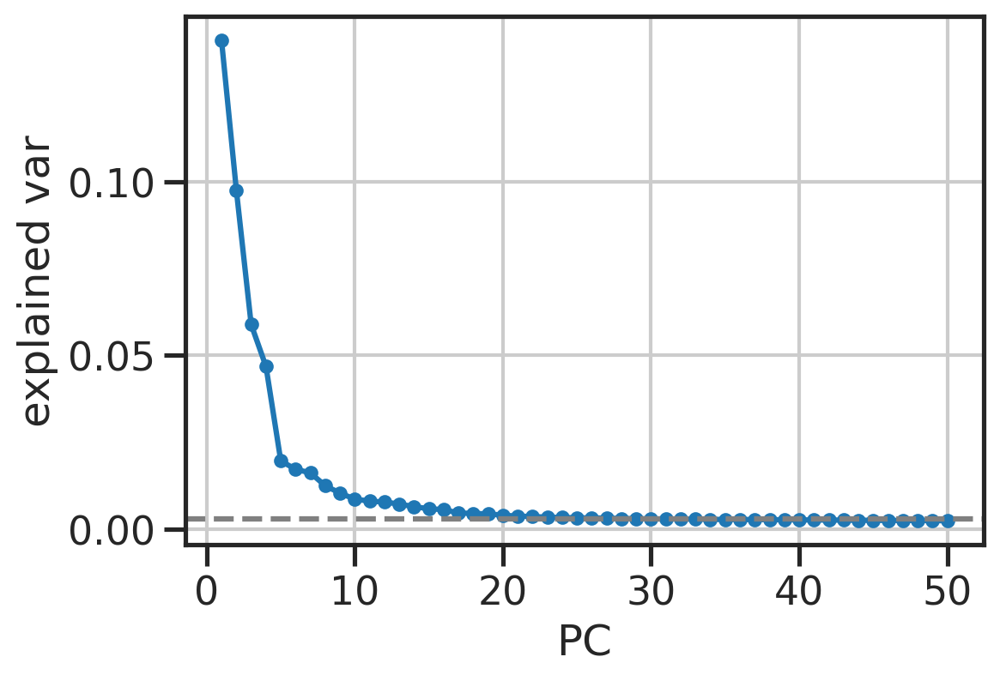

In [10]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(np.arange(len(pca.explained_variance_ratio_))+1, pca.explained_variance_ratio_, '-o', markersize=5)
ax.axhline(1/lognorm.shape[1], linestyle='--', color='gray')
ax.set_xlabel('PC')
ax.set_ylabel('explained var')

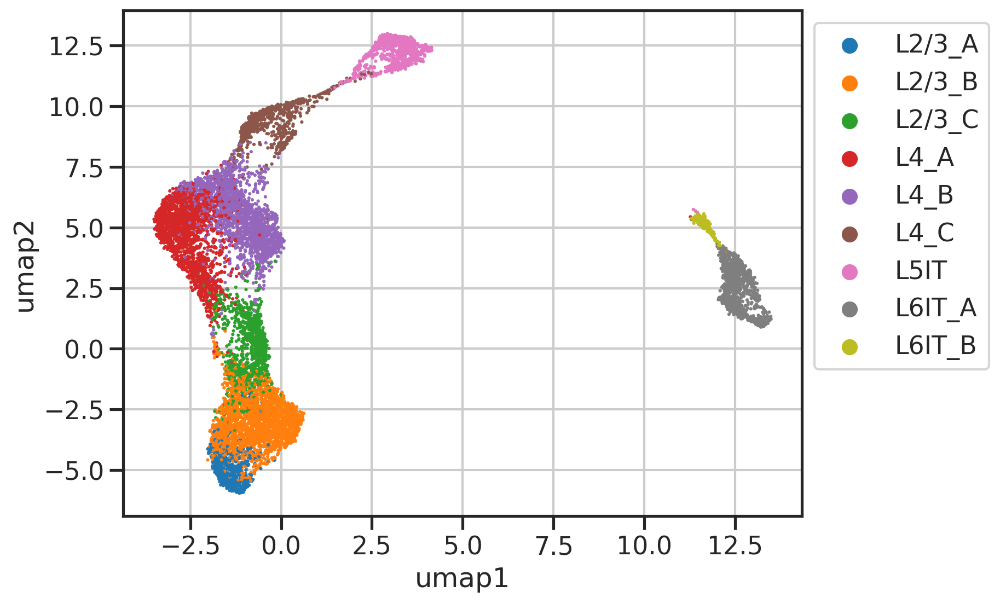

In [11]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                # hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

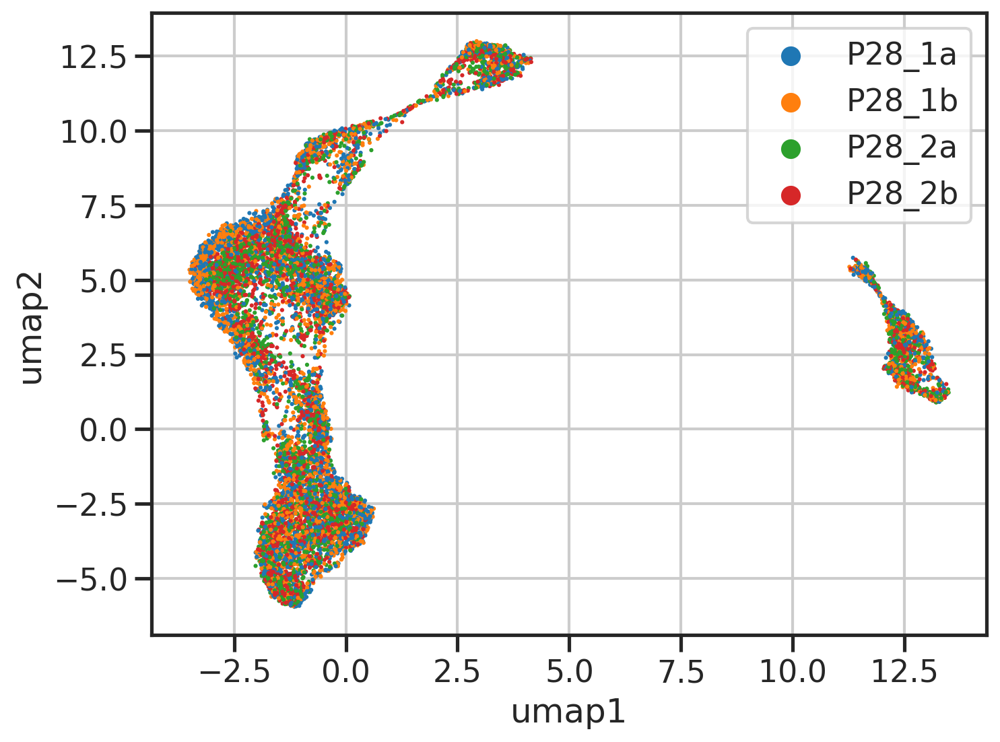

In [12]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                # hue='type',
                hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

In [13]:
def plot_pcs(res, npc, hue):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]

        sns.scatterplot(data=res.sample(frac=1, replace=False), 
                        x=x, y=y, 
                        hue=hue,
                        # hue_order=list(palette.keys()),
                        # palette=palette,
                        s=5, edgecolor='none', 
                        legend=legend,
                        ax=ax,
                       )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

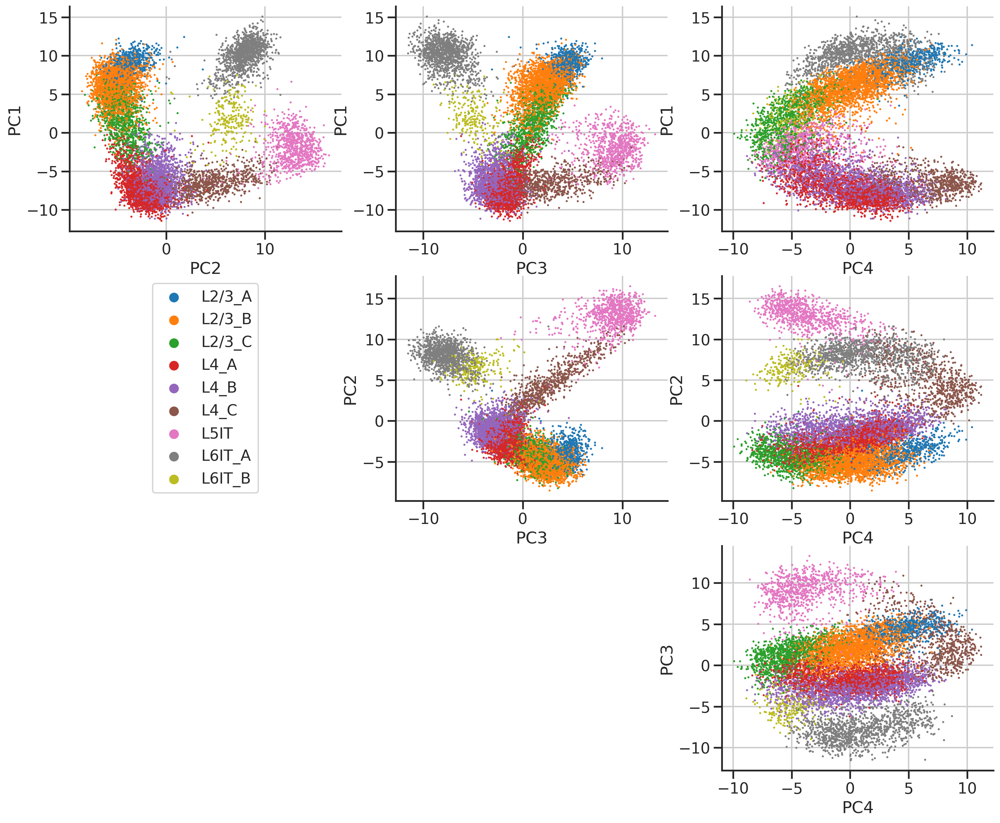

In [14]:
plot_pcs(res, 4, 'type')

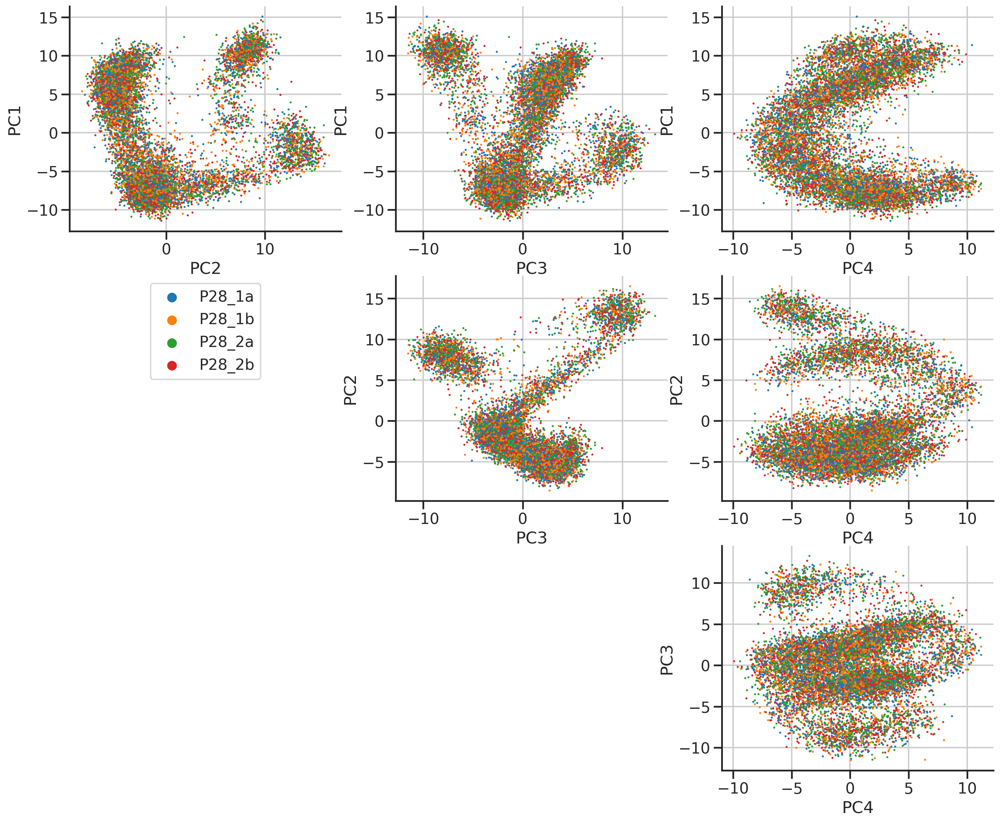

In [15]:
plot_pcs(res, 4, 'samp')

# ptime analysis

In [16]:
adata.obsm['X_pca'] = pcs
sc.pp.neighbors(adata, n_neighbors=50, use_rep='X_pca')
sc.tl.diffmap(adata)
adata.uns['iroot'] = np.argmax(pcs[:,0]+pcs[:,2]) # max PC1+PC4
sc.tl.dpt(adata)

res['ptime'] = adata.obs['dpt_pseudotime'].values
cellidx = np.argsort(res['ptime'].values)

In [17]:
# # # gene ptime
# # weights = ((lognorm+1e-10)/(lognorm.sum(axis=0)+1e-10))
# # gptime  = res['ptime'].values.dot(weights)
# # geneidx = np.argsort(gptime)

# # Use P28 ordering
# f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
# gpt = pd.read_csv(f)
# gpt = gpt['gene_ptime'].values
# geneidx2 = np.argsort(gpt)

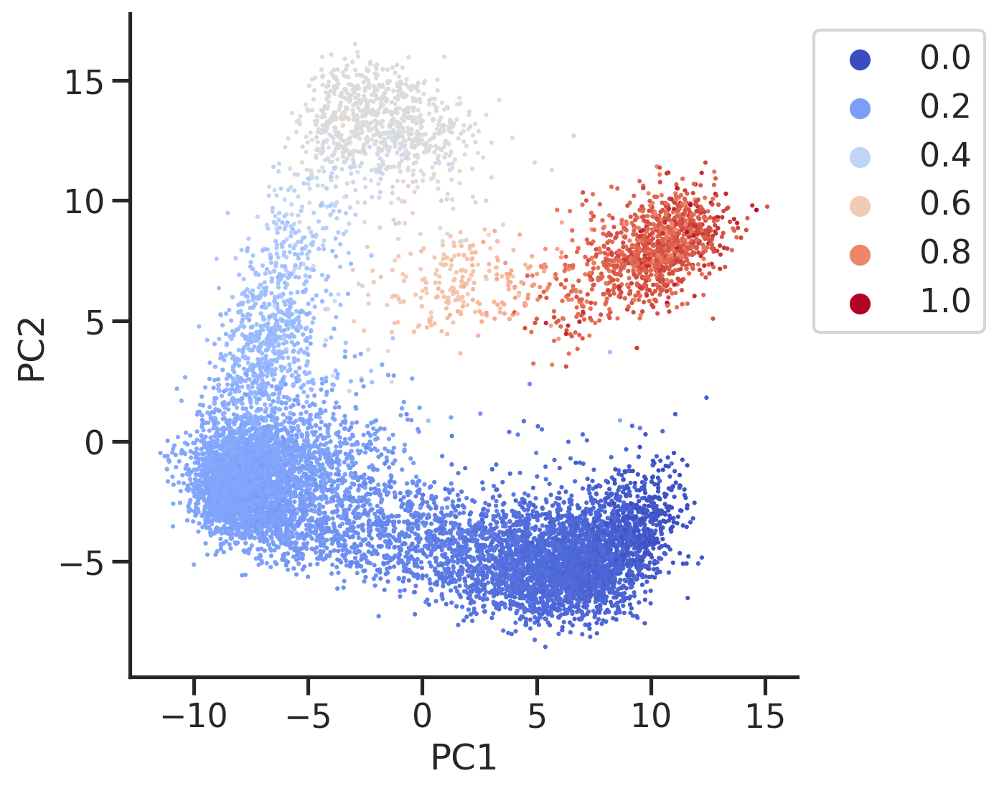

In [18]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=res, 
                x='PC1',
                y='PC2',
                hue='ptime',
                edgecolor='none',
                s=5,
                ax=ax,
                palette='coolwarm',
               )

ax.legend(bbox_to_anchor=(1,1), loc='upper left')
sns.despine(ax=ax)
ax.grid(False)
plt.show()

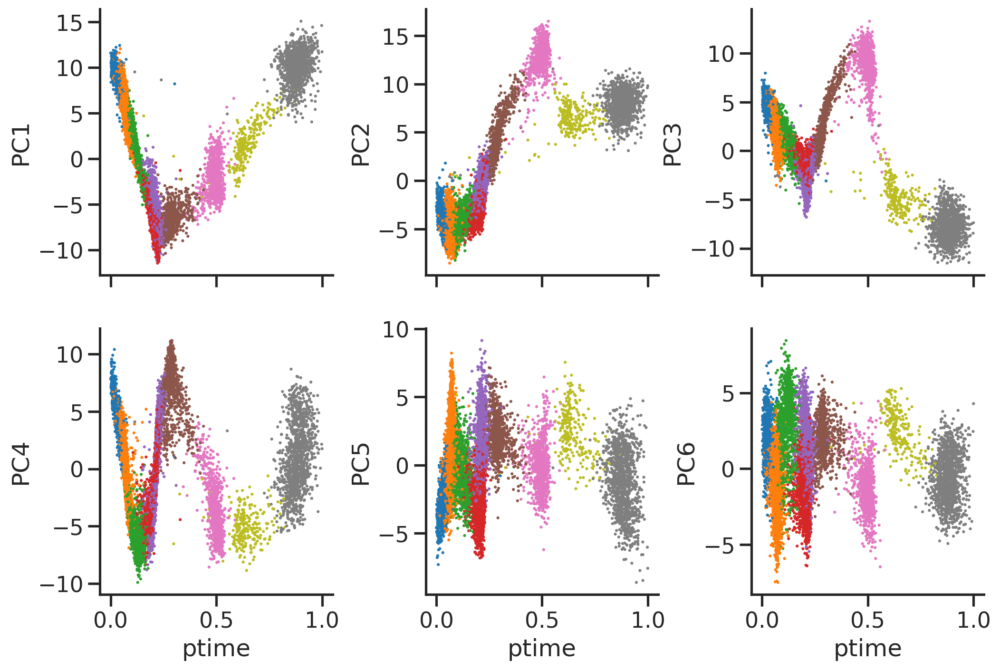

In [19]:
fig, axs = plt.subplots(2, 3, figsize=(4*3,4*2), sharex=True)
for i, ax in enumerate(axs.flat):
    sns.scatterplot(data=res, 
                    x='ptime',
                    y=f'PC{i+1}',
                    hue='type',
                    edgecolor='none',
                    s=5,
                    ax=ax,
                    legend=False,
                   )
    ax.grid(False)
    sns.despine(ax=ax)
fig.subplots_adjust(wspace=0.4)
plt.show()

# check PCs - what genes?

In [20]:
pc_weights = pca.components_
pc_weights.shape

pc1_gidx = np.argsort(np.abs( pc_weights[0]))[::-1]
pc1_gidx_up =     np.argsort( pc_weights[0])[::-1]
pc1_gidx_dn =     np.argsort(-pc_weights[0])[::-1]

pc2_gidx = np.argsort(np.abs(pc_weights[1]))[::-1]
pc2_gidx_up = np.argsort(pc_weights[1])[::-1]
pc2_gidx_dn = np.argsort(-pc_weights[1])[::-1]

pc3_gidx = np.argsort(np.abs(pc_weights[2]))[::-1]
pc3_gidx_up = np.argsort(pc_weights[2])[::-1]
pc3_gidx_dn = np.argsort(-pc_weights[2])[::-1]

pc4_gidx = np.argsort(np.abs(pc_weights[3]))[::-1]
pc4_gidx_up = np.argsort(pc_weights[3])[::-1]
pc4_gidx_dn = np.argsort(-pc_weights[3])[::-1]

pc5_gidx = np.argsort(np.abs( pc_weights[4]))[::-1]
pc5_gidx_up =     np.argsort( pc_weights[4])[::-1]
pc5_gidx_dn =     np.argsort(-pc_weights[4])[::-1]

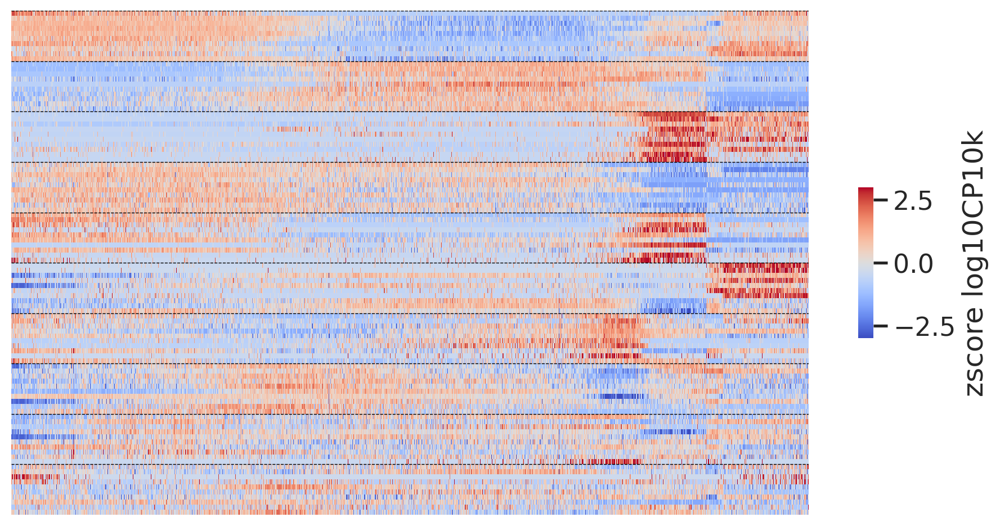

In [21]:
mosaic = ("."+"A"*20+"\n")*10 + ("."+"."*20+"\n") + ("."+"."*20+"\n")

gidx = np.hstack([
    pc1_gidx_up[:10], pc1_gidx_dn[:10], 
    pc2_gidx_up[:10], pc2_gidx_dn[:10], 
    pc3_gidx_up[:10], pc3_gidx_dn[:10], 
    pc4_gidx_up[:10], pc4_gidx_dn[:10], 
    pc5_gidx_up[:10], pc5_gidx_dn[:10], 
])

fig, axdict = plt.subplot_mosaic(mosaic, figsize=(12,7))
ax = axdict['A']
sns.heatmap(zlognorm[cellidx][:,gidx].T,
            xticklabels=False,
            yticklabels=False,
            cbar_kws=dict(shrink=0.3, label='zscore log10CP10k', aspect=10),
            center=0,
            vmax=3,
            vmin=-3,
            cmap='coolwarm',
            rasterized=True,
            ax=ax,
           )
ax.hlines(np.arange(0,50*2,10), 0, len(cellidx), color='k', linestyle='--', linewidth=0.5)

plt.show()

# order genes?

In [22]:
def get_gptime(adata):
    """
    """

    lognorm = np.array(adata.layers['lognorm'].todense())
    # # gene ptime
    weights = ((lognorm+1e-10)/(lognorm.sum(axis=0)+1e-10))

    gptime  = adata.obs['dpt_pseudotime'].values.dot(weights)
    gidx = np.argsort(gptime)
    return gptime, gidx

In [23]:
def plot_heatmap(zlognorm, cellidx, geneidx,
                 types, samps, 
                 cmap_d1,
                 cmap_d2,
                 title="",
                ):
    """
    """
    mosaic = ("."+"A"*20+"\n")*10 + ("."+"C"*20+"\n") + ("."+"D"*20+"\n")

    fig, axdict = plt.subplot_mosaic(mosaic, figsize=(12,7))
    ax = axdict['A']
    sns.heatmap(zlognorm[cellidx][:,geneidx].T,
                xticklabels=False,
                yticklabels=20,
                cbar_kws=dict(shrink=0.3, label='zscore log10CP10k', aspect=10),
                center=0,
                vmax=3,
                vmin=-3,
                cmap='coolwarm',
                rasterized=True,
                ax=ax,
               )
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_ylabel('Genes')

    ax = axdict['C']
    sns.heatmap(pd.factorize(types[cellidx], sort=True)[0].reshape(-1,1).T, 
                xticklabels=False,
                yticklabels=False,
                cmap=cmap_d1,
                cbar_kws=dict(ticks=[], shrink=1.2, aspect=3, label='type'),
                rasterized=True,
                ax=ax, 
               )
    fig.axes[-1].set_ylabel(fig.axes[-1].get_ylabel(), rotation=0, ha='left')

    ax = axdict['D']
    sns.heatmap(pd.factorize(samps[cellidx], sort=True)[0].reshape(-1,1).T, 
                xticklabels=1000,
                yticklabels=False,
                cmap=cmap_d2,
                cbar_kws=dict(ticks=[], shrink=1.2, aspect=3, label='sample'),
                rasterized=True,
                ax=ax, 
               )
    ax.set_xlabel('Cells')
    fig.axes[-1].set_ylabel(fig.axes[-1].get_ylabel(), rotation=0, ha='left')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)

    fig.subplots_adjust(hspace=0.5)
    fig.suptitle(title, fontsize=15)
    # powerplots.savefig_autodate(fig, os.path.join(outdir_fig, f'heatmap_{sample}_v4.pdf'))
    plt.show()
    
def run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this=None, titletag=''):
    """
    """
    print(len(genes_grad_this))
    
    if ptime_cells_this is None:
        ptime_cells_this = cells_this

    # get gene order
    adata_gptime_this = adata[adata.obs['Subclass'].isin(ptime_cells_this), genes_grad_this]
    gptime_this, gptime_idx_this = get_gptime(adata_gptime_this)
    
    # get cell order
    adata_grad_this = adata[adata.obs['Subclass'].isin(cells_this), genes_grad_this]
    zlognorm_this = zscore(np.array(adata_grad_this.layers['lognorm'].todense()), axis=0)
    cellidx_this = np.argsort(adata_grad_this.obs['dpt_pseudotime'])
    types_this = adata_grad_this.obs['easitype']
    samps_this = adata_grad_this.obs['sample']

    # plot
    my_colors_d1 = [palette_types[i] for i in np.unique(types_this)]
    if len(my_colors_d1) == 1:
        my_colors_d1 = [(0,0,0)] + my_colors_d1
    cmap_d1 = LinearSegmentedColormap.from_list('', my_colors_d1, len(my_colors_d1))
    plot_heatmap(zlognorm_this, cellidx_this, gptime_idx_this,
                 types_this, samps_this, 
                 cmap_d1, cmap_d2, title=titletag+" "+",".join(cells_this)+"\nOrdered by "+",".join(ptime_cells_this))
    return gptime_this
    
def run_heatmap_v2(adata, genes_grad_this, cells_this, gptime_idx_this):
    """
    """
    # print(cond.sum())
    
#     if ptime_cells_this is None:
#         ptime_cells_this = cells_this

#     # get gene order
#     adata_gptime_this = adata[adata.obs['Subclass'].isin(ptime_cells_this), genes_grad_this]
#     gptime_this, gptime_idx_this = get_gptime(adata_gptime_this)
    # gptime_idx_this
    
    # get cell order
    adata_grad_this = adata[adata.obs['Subclass'].isin(cells_this), genes_grad_this]
    zlognorm_this = zscore(np.array(adata_grad_this.layers['lognorm'].todense()), axis=0)
    cellidx_this = np.argsort(adata_grad_this.obs['dpt_pseudotime'])
    types_this = adata_grad_this.obs['easitype']
    samps_this = adata_grad_this.obs['sample']

    # plot
    my_colors_d1 = [palette_types[i] for i in np.unique(types_this)]
    if len(my_colors_d1) == 1:
        my_colors_d1 = [(0,0,0)] + my_colors_d1
    cmap_d1 = LinearSegmentedColormap.from_list('', my_colors_d1, len(my_colors_d1))
    plot_heatmap(zlognorm_this, cellidx_this, gptime_idx_this,
                 types_this, samps_this, 
                 cmap_d1, cmap_d2, title=",".join(cells_this)+"\nOrdered by "+",".join(ptime_cells_this))

In [24]:
num_cells = adata.obs['Subclass'].value_counts().sort_index()
cumsum_cells = np.cumsum(num_cells)
num_cells, cumsum_cells

(L2/3    4044
 L4      4732
 L5IT     849
 L6IT    1436
 Name: Subclass, dtype: int64,
 L2/3     4044
 L4       8776
 L5IT     9625
 L6IT    11061
 Name: Subclass, dtype: int64)

In [25]:
ressort = res.iloc[cellidx]
omat = zlognorm[cellidx]
ocpt = ressort['ptime'].values

In [26]:
allcolors2 = sns.color_palette('tab10', 10)
allcolors2

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [27]:
palette_types = collections.OrderedDict({
    'L2/3_A': allcolors2[0],
    'L2/3_B': allcolors2[1],
    'L2/3_C': allcolors2[2],
    
    'L4_A': allcolors2[3],
    'L4_B': allcolors2[4],
    'L4_C': allcolors2[5],
    
    'L5IT': allcolors2[6],
    
    'L6IT_A': allcolors2[7],
    'L6IT_B': allcolors2[8],
})             

In [28]:
choices2 = sns.color_palette('tab20', 20)
choices2

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [29]:
my_colors_d1 = tuple([b for a, b in palette_types.items()])
# cmap_d1 = LinearSegmentedColormap.from_list('', my_colors, len(my_colors))

my_colors = tuple(list(choices2[6:8])+list(choices2[14:16]))
cmap_d2 = LinearSegmentedColormap.from_list('', my_colors, len(my_colors))

# ncell, ngene = zlognorm.shape

338


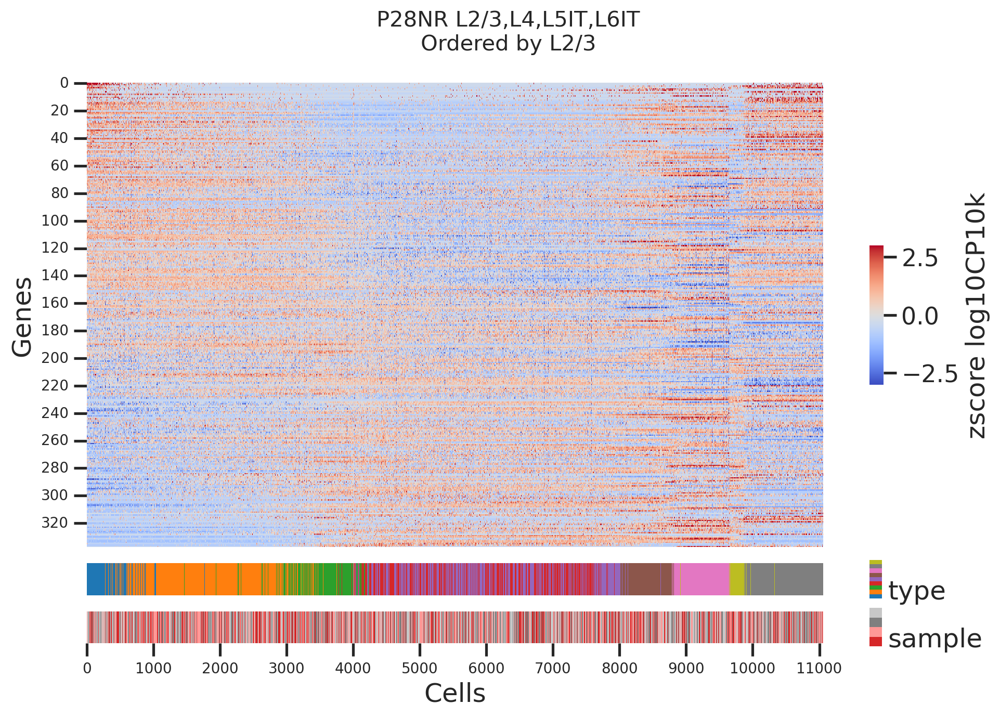

In [30]:
cells_this = ['L2/3', 'L4', 'L5IT', 'L6IT']
ptime_cells_this = ['L2/3'] #, 'L5IT', 'L6IT']
genes_grad_this = genes_it
gptime_l23 = run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this, titletag=case)

338


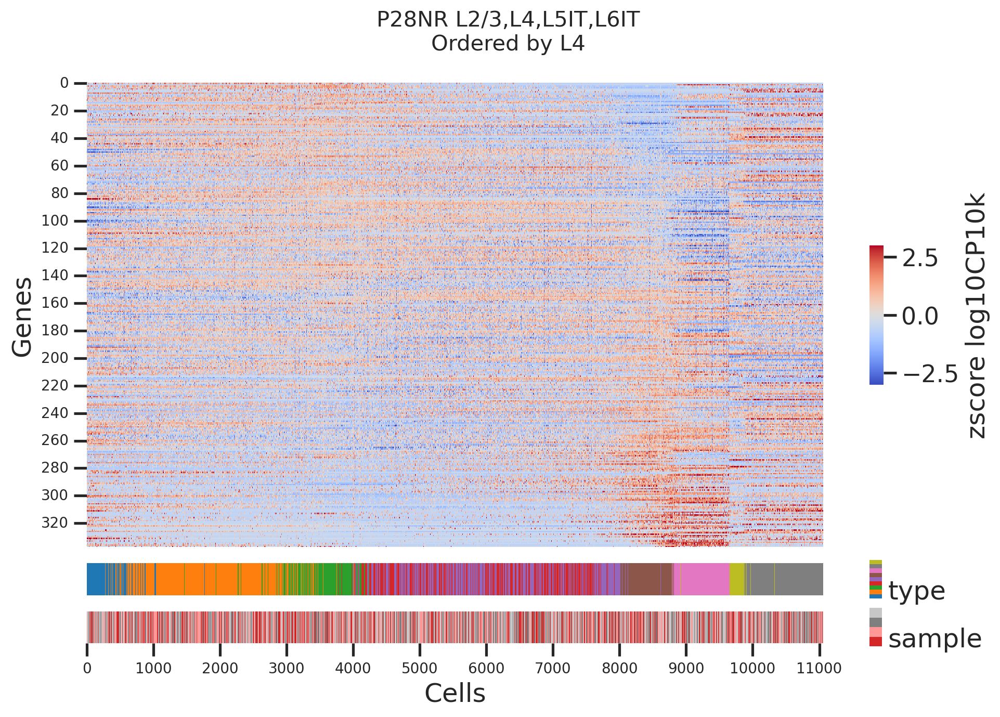

338


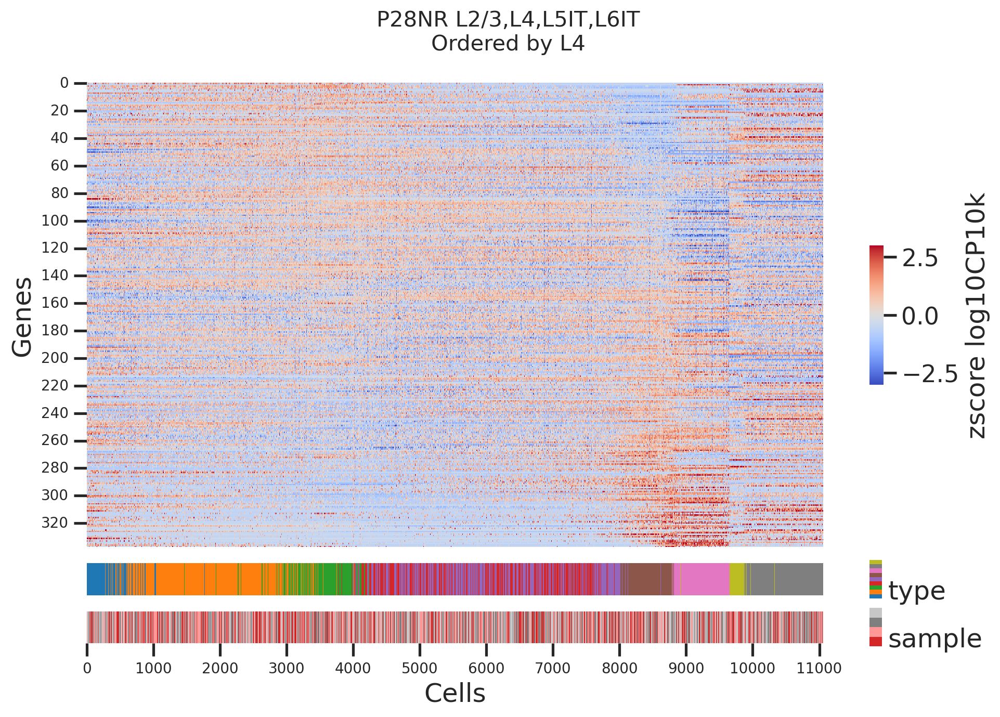

In [31]:
cells_this = ['L2/3', 'L4', 'L5IT', 'L6IT']
ptime_cells_this = ['L4'] #, 'L5IT', 'L6IT']
genes_grad_this = genes_it
run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this, titletag=case)
gptime_l4 = run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this, titletag=case)

338


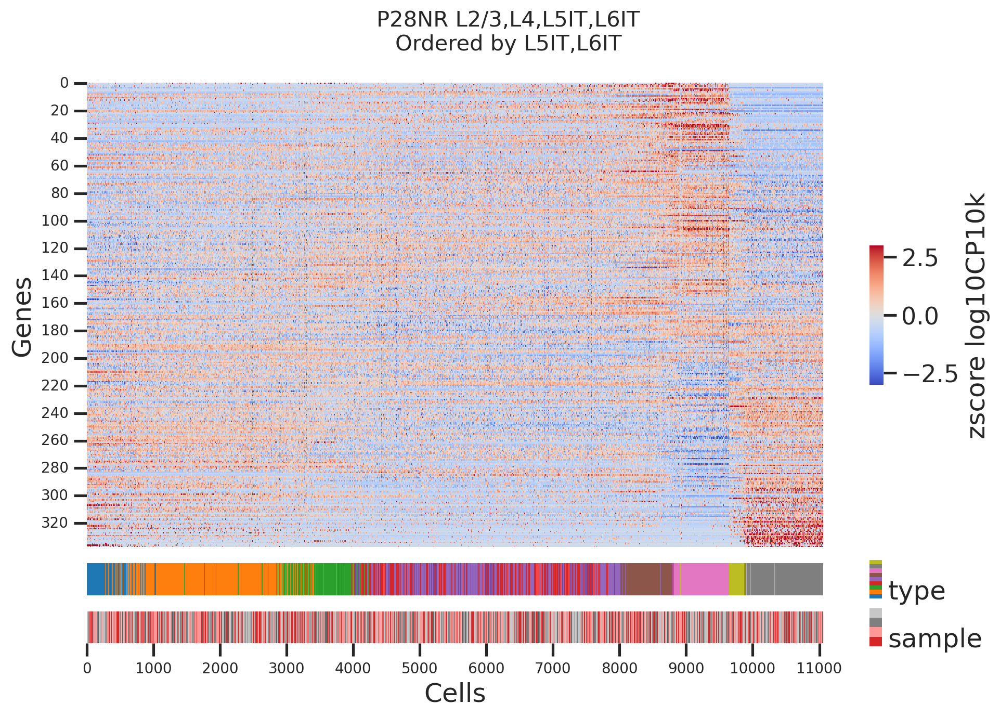

338


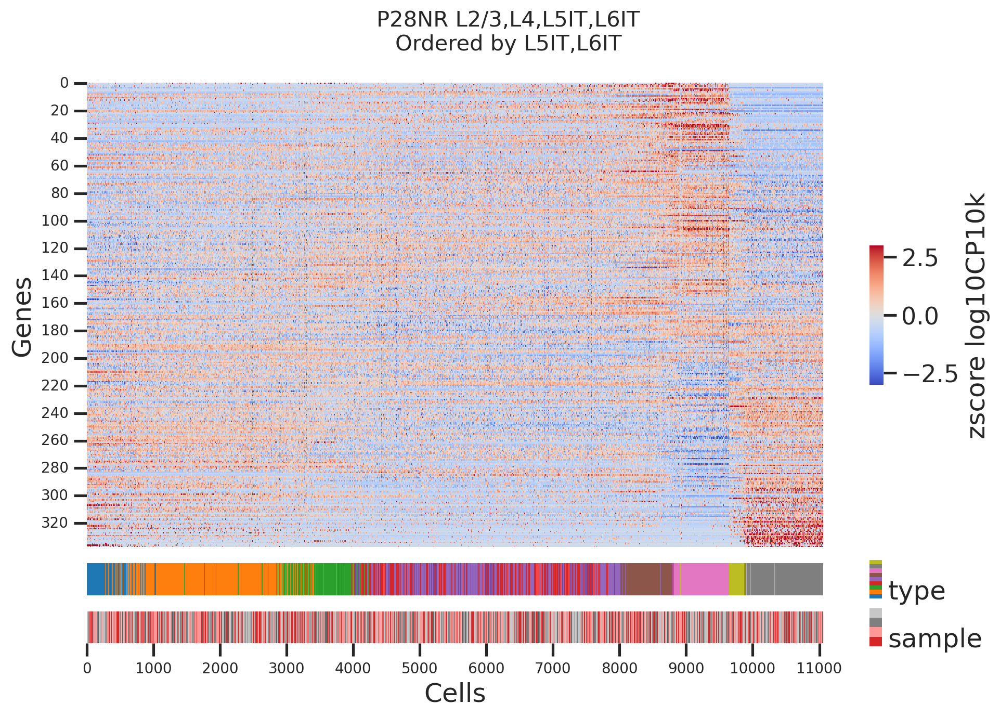

In [32]:
cells_this = ['L2/3', 'L4', 'L5IT', 'L6IT']
ptime_cells_this = ['L5IT', 'L6IT']
genes_grad_this = genes_it
run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this, titletag=case)
gptime_l56 = run_heatmap(adata, genes_grad_this, cells_this, ptime_cells_this, titletag=case)

In [33]:
# record cell order gene order
# gptime_l23

In [34]:
res_cells = adata.obs.copy()[['dpt_pseudotime']]
res_cells

,dpt_pseudotime
AAACCCACACCCTAGG-1-P28_1a-P28,0.196043
AAACCCAGTTCTCTCG-1-P28_1a-P28,0.064076
AAACCCATCCTAGCTC-1-P28_1a-P28,0.231375
AAACGAAAGCAAGGAA-1-P28_1a-P28,0.075800
AAACGAATCAGGGTAG-1-P28_1a-P28,0.690333
...,...
TTTGGTTGTGTAGCAG-1-P28_2b-P28,0.153745
TTTGGTTTCGTTCCCA-1-P28_2b-P28,0.220306
TTTGTTGAGCCGATTT-1-P28_2b-P28,0.220069
TTTGTTGCAAGTGATA-1-P28_2b-P28,0.074567


In [35]:
res_genes = adata.var.copy()
res_genes['ptime_l23'] = gptime_l23
res_genes['ptime_l4'] = gptime_l4
res_genes['ptime_l56'] = gptime_l56
res_genes

,ptime_l23,ptime_l4,ptime_l56
Kcnq5,0.078856,0.222606,0.695823
Rims1,0.077807,0.223217,0.695342
Col19a1,0.078534,0.203949,0.693794
Pam,0.068713,0.222543,0.755499
Cntnap5a,0.069253,0.256070,0.600009
...,...,...,...
AC149090.1,0.073119,0.225052,0.703664
Ntng1,0.088997,0.232805,0.800567
Slc24a2,0.074881,0.225441,0.707347
RF01962,0.089044,0.227297,0.823494


In [36]:
fout = os.path.join(outdir, f"{case}_cellptime.csv")
print(fout)
res_cells.to_csv(fout)
!head $fout

/data/qlyu/v1/results/P28NR_cellptime.csv
,dpt_pseudotime
AAACCCACACCCTAGG-1-P28_1a-P28,0.19604313
AAACCCAGTTCTCTCG-1-P28_1a-P28,0.064076476
AAACCCATCCTAGCTC-1-P28_1a-P28,0.23137538
AAACGAAAGCAAGGAA-1-P28_1a-P28,0.075800486
AAACGAATCAGGGTAG-1-P28_1a-P28,0.6903332
AAACGCTAGGATCATA-1-P28_1a-P28,0.22218323
AAACGCTAGTTTGCTG-1-P28_1a-P28,0.08782441
AAACGCTCAACCGTGC-1-P28_1a-P28,0.12506343
AAAGAACAGCATTGTC-1-P28_1a-P28,0.22013597


In [37]:
fout = os.path.join(outdir, f"{case}_geneptime.csv")
print(fout)
res_genes.to_csv(fout)
!head $fout

/data/qlyu/v1/results/P28NR_geneptime.csv
,ptime_l23,ptime_l4,ptime_l56
Kcnq5,0.07885607,0.22260615,0.695823
Rims1,0.07780704,0.2232168,0.6953417
Col19a1,0.078534454,0.20394945,0.6937937
Pam,0.06871291,0.22254251,0.7554989
Cntnap5a,0.069253445,0.2560705,0.60000944
Gm28928,0.072943754,0.2315374,0.70260197
Atp2b4,0.05920602,0.23004436,0.81820816
Brinp3,0.08434197,0.22231779,0.7091565
Rgs8,0.06294243,0.2353511,0.80569136
